# Intercomparison of satellite sea ice extent estimates

Production date: DD-MM-YYYY 

Produced by: Nansen Environmental and Remote Sensing Center (NERSC)


## 🌍 Use case: Monitoring long-term evolution of sea ice type

## ❓ Quality assessment question
* **How consistent is the evolution of multi-year sea-ice extent in the Arctic across different satellite sea-ice products?**

This study examines the geographical distribution of multi-year sea ice (MYI) in the Arctic, providing an analysis of its evolution since the early 1990s. The assessment focuses on multi-year sea ice, which is sea ice that has survived at least one melting season, because its extent in the Arctic has significantly declined over the last few decades (e.g., [[1]](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2011GL047735)). This change is of interest because of the repercussions it has on the Earth's climate which, in turn, can impact the Arctic ecosystem and affect human activities in the region (e.g., [[2]](https://www.cambridge.org/core/books/ocean-and-cryosphere-in-a-changing-climate/polar-regions/8D76B8865B796C16991F7A9FB6271C2D)). 

The assessment uses two different sea-ice products. This choice helps to determine the robustness of the results and highlight the properties of the two datasets. The first dataset, referred to as "CDS dataset", provides information on sea-ice types in the region, while the second, the "NERSC dataset", classifies sea ice into age categories. 

Both datasets indicate a general decrease in Arctic multi-year sea ice extent over the last three decades, especially in the Beaufort Sea, the Chukchi Sea, and the Eurasian Basin. However, they show several differences on a regional scale. For example, the NERSC dataset reports a consistent higher presence of multi-year sea ice in the Greenland Sea when compared to the CDS dataset. 

## 📢 Quality assessment statement

```{admonition} These are the key outcomes of this assessment
:class: note

* Both the CDS and the NERSC datasets reveal an overall decrease in multi-year sea ice extent over Arctic since 1991, with the most significant reductions occurring in the Beaufort Sea, the Chukchi Sea, and the Eurasian Basin. 

* Despite their consistent conclusion, notable differences exist between the two datasets. Specifically, the CDS dataset tends to overestimate multi-year sea ice presence in the Beaufort Sea and underestimate it in the Greenland Sea when compared to the NERSC dataset. It is shown that these discrepancies tend to be minimum in October and to become more pronounced as each winter progresses. 

* The inclusion of ‘ambiguous’ data points in the CDS dataset has two main implications on the estimates of multi-year sea ice extent in the Arctic. At first, it affects the total amount of multi-year sea ice in the region, even though it only little alters its geographic distribution. Secondly, it increases its day-to-day variability.
```


## 📋 Methodology

The evolution of multi-year sea ice extent in the Arctic is based on two different datasets. This choice helps showing the properties of the two products as well as assessing the robustness of the results. The first dataset is freely available on the Copernicus Climate Data Store (CDS) website under the name [Sea ice edge and type daily gridded data from 1978 to present derived from satellite observations](https://cds.climate.copernicus.eu/datasets/satellite-sea-ice-edge-type?tab=overview). The data provides information on sea-ice types in the Arctic Ocean by classifying sea ice into four categories: 'open water', 'first-year ice', 'multi-year ice', and 'ambiguous'. The classification primarily relies on brightness temperature observed by passive microwave radiometers. For the purposes of this Notebook, only the subset of the dataset labelled as Climate Data Records (CDRs) is considered, thereby excluding the Interim Climate Data Records (ICDRs). The ICDRs have been excluded from this work because, despite them extending the temporal extent of the analysis, their consistency has not been as thoroughly verified as that of the CDRs.

The second dataset is described by [[3]](https://tc.copernicus.org/articles/12/2073/2018/) and is provided by Dr. Anton Korosov (anton.korosov@nersc.no) on request. This dataset differs from the previous one as it uses an Eulerian advection scheme, together with passive-microwave-derived concentration and drift estimations, to classify sea ice into age categories, instead ice types. Specifically, the dataset provides an estimate of sea-ice age over the Artic, and an estimate of individual ice-age fractions at each grid point. For convenience, the former dataset will be referred to as "CDS dataset" whereas the latter as "NERSC dataset". 

The assessment uses two distinct approaches to identify the grid points characterized by multi-year sea ice in the CDS and in the NERSC datasets. In the CDS dataset, the presence of multi-year sea ice is determined using two different criteria: first, by selecting the pixels classified as ‘multi-year ice’, and second, by considering the pixels classified as both ‘multi-year ice’ and ‘ambiguous’. The results obtained with these two criteria, labelled as 'use_ambiguous=False' and 'use_ambiguous=True', are then compared to highlight the role of the pixels classified as ambiguous. Instead, in the NERSC dataset, multi-year sea ice is identified by selecting the pixels where the concentration of first-year sea ice (FYI) does not exceed that of sea ice that is older than one year, and where the sum of the two exceeds 0.15 (where there is some ice present). 

The analysis is performed on the overlapping interval of the two datasets during the boreal winters between October 1991 and April 2020, where with boreal winter we refer to the period ranging from the 1st of October of one year to the 30th of April of the following year. The upper limit is set by the CDS dataset, which provides information on sea-ice types for the boreal winter months between October 1978 and December 2020, whereas the lower limit is set by the NERSC dataset, which covers the period from September 1991 to May 2023. 

The assessment splits the analysis into two parts, that we now briefly describe: 

[](temporal) 
* The first part presents and compares the temporal evolution of the area covered by multi-year sea ice provided by the CDS and the NERSC datasets. This section also quantifies the mismatch between the two datasets by analysing the bias and the integrated ice type error (IITE) of the NERSC dataset relative to CDS dataset. The bias is the difference between the area where the CDS dataset reports multi-year sea ice while the NERSC dataset does not, and the area where the CDS dataset does not report multi-year sea ice while the NERSC dataset does. Instead, the integrated ice type error is the sum of these two areas. 

[](spatial) 
* The second part further investigates the temporal evolution of multi-year sea ice in the Arctic with the help of maps. Specifically, it presents and compares, for each datasets, for each month and at each pixel, the percentage of days associated with multi-year sea ice over three different periods:
    - from Oct 1991 to Apr 2001 (10 boreal winters)
    - from Oct 2001 to Apr 2011 (10 boreal winters)
    - from Oct 2011 to Apr 2020 (9 boreal winters)

### Import libraries

In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
from c3s_eqc_automatic_quality_control import download, plot
import calendar

plt.style.use("seaborn-v0_8-notebook")

### Set Parameters

In [2]:
# Define time periods
periods = [
    slice(1991, 2000),
    slice(2001, 2010),
    slice(2011, 2019),
]

# Define path to NERSC data
NERSC_PATH = "/data/wp5/mangini_fabio/nersc_ice_age_v2p1"

### Define requests

In [3]:
collection_id = "satellite-sea-ice-edge-type"


def get_requests(year_start, year_stop):
    common_request = {
        "cdr_type": "cdr",
        "variable": "sea_ice_type",
        "region": "northern_hemisphere",
        "version": "3_0",
        "day": [f"{day:02d}" for day in range(1, 32)],
    }
    return [
        common_request
        | {
            "year": [str(year) for year in range(year_start, year_stop)],
            "month": [f"{month:02d}" for month in range(10, 13)],
        },
        common_request
        | {
            "year": [str(year + 1) for year in range(year_start, year_stop)],
            "month": [f"{month:02d}" for month in range(1, 5)],
        },
    ]

request_timeseries = get_requests(
    year_start=min([period.start for period in periods]),
    year_stop=max([period.stop for period in periods]),
)

requests_periods = {}
for period in periods:
    label = f"Oct {period.start} - Apr {period.stop+1}"
    requests_periods[label] = get_requests(period.start, period.stop)

### Define functions to cache

In [4]:
def get_nersc_data(ds_cds, nersc_path):
    if nersc_path is None:
        nersc_path = NERSC_PATH

    paths = ds_cds["time"].dt.strftime(
        f"{nersc_path}/%Y/arctic25km_sea_ice_age_v2p1_%Y%m%d.nc"
    )
    ds_nersc = xr.open_mfdataset(
        set(paths.values),
        concat_dim="time",
        combine="nested",
        data_vars="minimal",
        coords="minimal",
        compat="override",
    )
    ds_nersc = ds_nersc.rename(x="xc", y="yc")
    ds_nersc = ds_nersc.assign_coords(
        {coord: ds_cds[coord] for coord in ("xc", "yc", "longitude", "latitude")}
    )
    return ds_nersc


def get_nersc_multiyear_ice(
    ds_cds,
    use_fyi,
    age_threshold,
    conc_threshold,
    nersc_ice_age_path,
):
    ds_nersc = get_nersc_data(ds_cds, nersc_ice_age_path)

    if age_threshold is not None:
        assert not use_fyi
        assert conc_threshold is None
        return ds_nersc["sia"] > age_threshold

    assert conc_threshold is not None

    conc_myi = ds_nersc["conc_2yi"]
    n = 3
    while (varname := f"conc_{n}yi") in ds_nersc.variables:
        conc_myi += ds_nersc[varname].fillna(0)
        n += 1

    if not use_fyi:
        return conc_myi > conc_threshold

    conc_fyi = ds_nersc["conc_1yi"]
    return ((conc_myi + conc_fyi) > conc_threshold) & (conc_myi > conc_fyi)


def compute_spatial_sum(da, grid_cell_area, dim=("xc", "yc")):
    return grid_cell_area * da.sum(dim=dim)


def get_classification_mask(ds, use_ambiguous):
    da = ds["ice_type"]
    return (da >= 3) if use_ambiguous else (da == 3)


def compute_sea_ice_evaluation_diagnostics(
    ds,
    use_ambiguous,
    use_fyi,
    age_threshold,
    conc_threshold,
):
    # grid cell area of sea ice edge grid
    (dx,) = set(ds["xc"].diff("xc").values)
    grid_cell_area = (dx**2) * 1.0e-6  # 10^6 km2

    # Masks
    da_cds = get_classification_mask(ds, use_ambiguous)
    da_nersc = get_nersc_multiyear_ice(
        ds,
        use_fyi=use_fyi,
        age_threshold=age_threshold,
        conc_threshold=conc_threshold,
        nersc_ice_age_path=None,
    )

    # Fill variables
    units = "$10^6$km$^2$"
    dataarrays = {}
    dataarrays["mysi_extent"] = compute_spatial_sum(da_cds, grid_cell_area)
    dataarrays["mysi_extent"].attrs = {
        "standard_name": "multi_year_sea_ice_extent",
        "units": units,
        "long_name": "Multi-year sea ice extent from CDS dataset",
    }

    dataarrays["mysi_extent_age"] = compute_spatial_sum(da_nersc, grid_cell_area)
    dataarrays["mysi_extent_age"].attrs = {
        "standard_name": "multi_year_sea_ice_extent_age",
        "units": units,
        "long_name": "Multi-year sea ice extent from NERSC sea ice age product",
    }

    over = compute_spatial_sum(da_cds & ~da_nersc, grid_cell_area)
    under = compute_spatial_sum(~da_cds & da_nersc, grid_cell_area)
    dataarrays["mysi_extent_bias"] = over - under
    dataarrays["mysi_extent_bias"].attrs = {
        "standard_name": "multi_year_sea_ice_extent_bias",
        "units": units,
        "long_name": "Multi-year sea ice extent bias",
    }

    dataarrays["iite"] = over + under
    dataarrays["iite"].attrs = {
        "standard_name": "integrated_ice_type_error",
        "units": units,
        "long_name": "Integrated ice type error",
    }
    return xr.Dataset(dataarrays)


def compute_multiyear_ice_percentage(da):
    da = da.groupby("time.month").map(
        lambda da: 100 * da.sum("time") / da.sizes["time"]
    )
    da.attrs = {
        "units": "%",
        "long_name": "Multi-year sea ice percentage",
    }
    return da.to_dataset(name="percentage")


def compute_cds_multiyear_ice_percentage(ds, use_ambiguous):
    da = get_classification_mask(ds, use_ambiguous)
    return compute_multiyear_ice_percentage(da)


def compute_nersc_multiyear_ice_percentage(ds, use_fyi, age_threshold, conc_threshold):
    da = get_nersc_multiyear_ice(
        ds,
        use_fyi=use_fyi,
        age_threshold=age_threshold,
        conc_threshold=conc_threshold,
        nersc_ice_age_path=None,
    )
    return compute_multiyear_ice_percentage(da)

### Download and transform data

In [13]:
nersc_kwargs = {
    "use_fyi": True,
    "age_threshold": None,
    "conc_threshold": 0.15,
}
kwargs = {
    "chunks": {"year": 1},
    "concat_dim": "time",
    "combine": "nested",
    "data_vars": "minimal",
    "coords": "minimal",
    "compat": "override",
}

# NERSC Maps
datasets = []
for period, requests in requests_periods.items():
    print(f"NERSC Maps: {period=}")
    ds = download.download_and_transform(
        collection_id,
        requests,
        transform_func=compute_nersc_multiyear_ice_percentage,
        transform_func_kwargs=nersc_kwargs,
        transform_chunks=False,
        **kwargs,
    )
    datasets.append(ds.expand_dims(period=[period]))
ds_nersc = xr.concat(datasets, "period")

# CDS Maps
datasets = []
for period, requests in requests_periods.items():
    for use_ambiguous in (True, False):
        print(f"CDS Maps: {period=} {use_ambiguous=}")
        ds = download.download_and_transform(
            collection_id,
            requests,
            transform_func=compute_cds_multiyear_ice_percentage,
            transform_func_kwargs={"use_ambiguous": use_ambiguous},
            transform_chunks=False,
            **kwargs,
        )
        datasets.append(ds.expand_dims(use_ambiguous=[use_ambiguous], period=[period]))
ds_cds = xr.merge(datasets)

# Timeseries
datasets = []
for use_ambiguous in (True, False):
    print(f"Timeseries: {use_ambiguous=}")
    ds = download.download_and_transform(
        collection_id,
        request_timeseries,
        transform_func=compute_sea_ice_evaluation_diagnostics,
        transform_func_kwargs=nersc_kwargs | {"use_ambiguous": use_ambiguous},
        **kwargs,
    )
    datasets.append(ds.expand_dims(use_ambiguous=[use_ambiguous]).compute())
ds_timeseries = xr.concat(datasets, "use_ambiguous")

NERSC Maps: period='Oct 1991 - Apr 2001'
NERSC Maps: period='Oct 2001 - Apr 2011'
NERSC Maps: period='Oct 2011 - Apr 2020'
CDS Maps: period='Oct 1991 - Apr 2001' use_ambiguous=True
CDS Maps: period='Oct 1991 - Apr 2001' use_ambiguous=False
CDS Maps: period='Oct 2001 - Apr 2011' use_ambiguous=True
CDS Maps: period='Oct 2001 - Apr 2011' use_ambiguous=False
CDS Maps: period='Oct 2011 - Apr 2020' use_ambiguous=True
CDS Maps: period='Oct 2011 - Apr 2020' use_ambiguous=False
Timeseries: use_ambiguous=True


100%|██████████| 56/56 [13:20<00:00, 14.30s/it]


Timeseries: use_ambiguous=False


100%|██████████| 56/56 [11:29<00:00, 12.31s/it]


## 📈 Analysis and results

The temporal evolution of multi-year sea ice extent over the Arctic is analysed using a combination of plots and maps. The plots help quantify and compare the temporal evolution of the Arctic multi-year sea ice extent provided by the two datasets, while the maps help explain the differences between the two datasets by identifying the regions where the two products differ the most.  

(temporal)=
### Temporal evolution of the total area covered by multi-year sea ice in the Arctic 

The figure below consists of eight plots, arranged in a grid of four rows and two columns. The first and second rows display the daily multi-year sea ice extent for each boreal winter between October 1991 and April 2020, estimated from the CDS and the NERSC datasets, respectively. The third row shows the bias between the two datasets, while the fourth row shows the corresponding integrated ice type error. The columns distinguish between the two definitions of multi-year sea ice for the CDS dataset. The right column shows the results based solely on the grid points labelled as ‘multi-year ice’, whereas the left column on the grid points labelled as 'multi-year ice' and 'ambiguous'. 

In [14]:
def rearrange_year_vs_monthday(ds):
    ds = ds.convert_calendar("noleap")
    year = ds["time"].dt.year
    year = year.where(ds["time"].dt.month >= 10, year - 1)
    coords = {
        "year": ("time", year.values),
        "monthday": ("time", ds["time"].dt.strftime("%m-%d").values),
    }
    ds = ds.assign_coords(coords)
    return ds.set_index(time=tuple(coords)).unstack("time")


def plot_against_monthday(ds, cmap="viridis", **kwargs):
    defaults = {
        "row": "variable",
        "x": "time",
        "hue": "year",
        "add_legend": False,
        "figsize": (25, 15),
        "sharey": 'row',
    }
    ds = rearrange_year_vs_monthday(ds)

    da = ds.to_array()
    time = pd.to_datetime(
        [
            f"200{'1' if int(monthday[:2]) >= 10 else '2'}-{monthday}"
            for monthday in da["monthday"].values
        ]
    )
    da = da.assign_coords(time=("monthday", time)).sortby("time")

    colors = plt.get_cmap(cmap, da.sizes["year"]).colors
    with plt.rc_context({"axes.prop_cycle": plt.cycler(color=colors)}):
        facet = da.plot(**(defaults | kwargs))

    for ax, sel_dict in zip(facet.axs.flatten(), facet.name_dicts.flatten()):
        ax.grid()
        ax.set_xlabel('')
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%d %b"))
        ax.xaxis.set_tick_params(labelsize=15, rotation=45)

    for ax in facet.axs[:, 0]:
        ax.set_ylabel(ds[sel_dict["variable"]].attrs["units"], fontsize=15)
        ax.yaxis.set_tick_params(labelsize=15)

    for ax in facet.axs[0,:]:
        ax.title.set_fontsize(18)
    
    scalar_mappable = plt.cm.ScalarMappable(
        cmap=cmap,
        norm=plt.Normalize(vmin=da["year"].min(), vmax=da["year"].max()),
    )
    cbar = facet.fig.colorbar(scalar_mappable, ax=facet.axs, label="year") 
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.yaxis.label.set_fontsize(15)
    
    for label in facet.row_labels:
        *_, variable = label.get_text().split()
        long_name = ds[variable].attrs["long_name"].replace("from", "from\n")
        label.set_text(long_name)
        label.set_fontsize(15)
    
    return facet

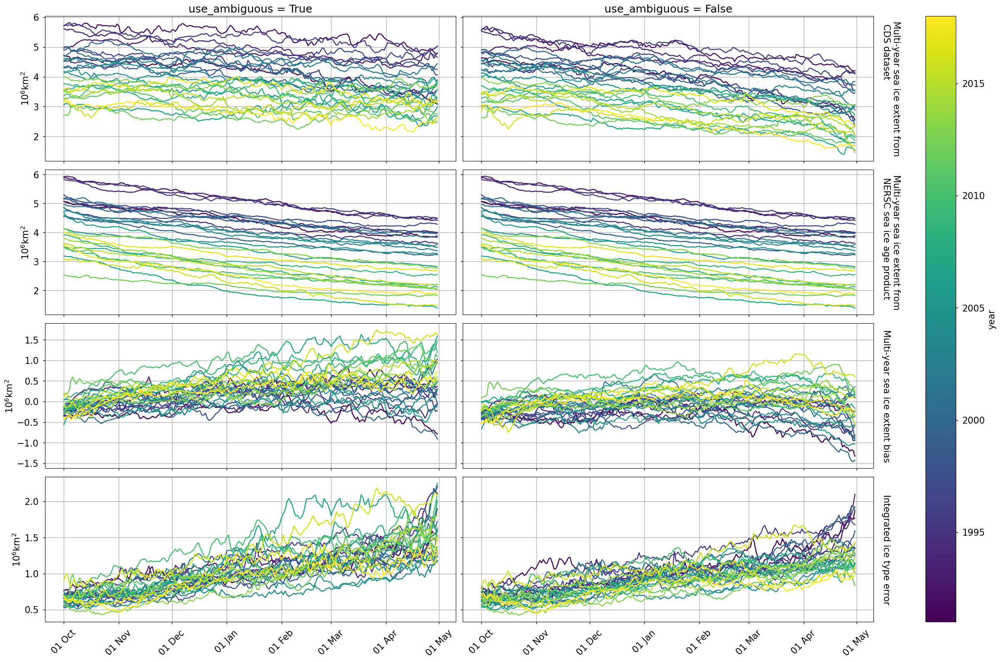

In [17]:
facet = plot_against_monthday(ds_timeseries, col="use_ambiguous")
plt.show()

The four plots at the top show that the two datasets yield comparable results, and that the inclusion of the grid points labelled as 'ambiguous' does not significantly alter the main conclusions. The results indicate that the spatial extent of multi-year sea ice in the Arctic has decreased since October 1991. Specifically, multi-year sea ice extent ranged between 5 and 6 million km$^2$ in October 1991, and droppped to between 3 and 4 million km$^2$ by October 2019. Similarly, the multi-year sea ice extent was mostly between 3.5 and 5 million km$^2$ in April 1992, and fell to between 1.5 and 3 million km$^2$ by April 2020. Furthermore, the datasets suggest that the multi-year sea ice extent tends to decrease throughout each boreal winter. This is expected because multi-year sea ice tend to be exported and also be compressed through ridging as winter progresses (the reader is referred to [[4]](https://tc.copernicus.org/articles/17/1873/2023/) for a comprehensive explanation of source and sinks of multi-year sea ice). 

However, while sharing similarities, the datasets present some significant differences. Notably, the CDS dataset exhibits a slightly greater day-to-day variability compared to the NERSC dataset when the pixels labelled as 'ambiguous' are included into the analysis. A thorough understanding of this discrepancy goes beyond the scope of this study. However, we hypothesize it to be partially attributed to atmospheric variability, which can affect the brightness temperature of sea ice and, therefore, the classification into first-year ice and multi-year sea ice. For example, warmer weather events pose a challenge to the classification of sea ice into ice types as they modify the surface of first-year sea ice, making it appear similar to multi-year sea ice (Product User Guide and Specification of the CDS dataset). This interpretation is corroborated by the day-to-day variability in the CDS dataset decreasing when the grid points labelled as 'ambiguous' are not considered.  

The differences between the two datasets also appear in the four plots at the bottom, which show the temporal evolution of the bias and the integrated ice type error. Both diagnostics tend to progressively diverge from zero as each boreal winter evolves. This is not entirely surprising as it might reflect the difficulty of the classification algorithm to distinguish between first-year sea ice and multi-year sea ice when the former has undergone significant deformations. In other words, the bias and the integrated ice type error might be lowest in October because, at the end of summer, the Arctic predominantly contains multi-year sea ice. This, in turn, limits the misclassification of first-year sea ice and multi-year sea ice in the two datasets. However, as winter progresses, first-year sea ice begins to form and, as it ages, it deforms. These deformations alter the surface roughness of first-year sea ice, making it resemble multi-year sea ice. This resemblance, in turn, can potentially lead to a misclassification by the algorithm. 

The figure above indicates that the exclusion from the analysis of the pixels labelled as 'ambiguous' leads to stronger decrease of multi-year sea ice extent throughout each boreal winter. This result better agrees with that provided by the NERSC dataset, with the exception of the month of April. In April, the penultimate subplot on the right shows a drop in the bias, especially during the first decade of the analysis, as indicated by the blue lines. Unfortunately, it is difficult to understand the causes behind this issue. On the one hand, the discrepancy might indicate that, in the month of April, some of the grid points labelled as 'ambiguous' contain multi-year ice. On the other hand, it might indicate that the NERSC dataset interprets part of first-year sea ice as multi-year sea ice. This might occur because, as noticed in [[3]](https://tc.copernicus.org/articles/12/2073/2018/), the algorithm might prioritize small concentration of multi-year ice, therefore overstimating the age of sea ice at each pixel. 


(spatial)=
### Spatial and temporal evolution of the region covered by multi-year sea ice in the Arctic

#### Maps of multi-year sea ice from NERSC dataset

The maps below visually complement the previous plots, illustrating the geographical distribution of multi-year sea ice in the Arctic, its evolution since the early 1990s, and the regions where the CDS and NERSC datasets diverge the most. 

The initial set of maps refers to the NERSC dataset and displays, for each month and grid point, the percentage of days associated with multi-year sea ice across three distinct periods: from October 1991 to April 2001, from October 2001 to April 2011, and from October 2011 to April 2020. The figure comprises 21 maps, with each row corresponding to one of the three periods and each column to a different month. 

In [8]:
def plot_maps(da, coastline_color='k', **kwargs):
    defaults = {
        "row": "period",
        "col": "month",
        "projection": ccrs.Stereographic(central_latitude=90.0),
        "cmap": cmocean.cm.ice,
    }
    da = da.sel(
        xc=slice(-2.5e3, 2.5e3),
        yc=slice(2.5e3, -2.5e3),
        month=[10, 11, 12, 1, 2, 3, 4],
    )
    da["month"] = [calendar.month_abbr[i] for i in da["month"].values]
    facet = plot.projected_map(da, **(defaults | kwargs))
    for ax in facet.axs.flatten():
        ax.coastlines(color=coastline_color, lw=1)
        ax.add_feature(cfeature.LAND, zorder=5, color='gainsboro')
        ax.patch.set_edgecolor('black')  
        ax.patch.set_linewidth(3) 
   
    for ax in facet.axs[0,:]:
        ax.title.set_fontsize(15)

    for i, label in enumerate(facet.row_labels):
        long_name = da["period"].values[i]
        label.set_text(long_name)
        label.set_fontsize(15)
    
    facet.cbar.ax.tick_params(labelsize=15)
    facet.cbar.ax.yaxis.label.set_fontsize(15)
    
    return facet

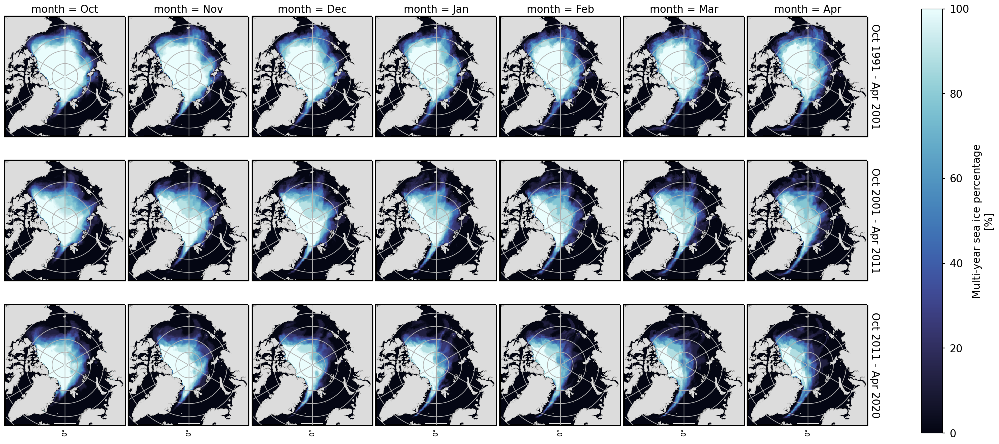

In [15]:
facet = plot_maps(ds_nersc["percentage"])
plt.show()

Consistent with the plots above, the maps show a significant decline in the multi-year sea ice extent since 1991, as well as throughout the boreal winters. The decline in multi-year sea ice appears to have mostly occurred in the Beaufort Sea, the Chukchi Sea, and the Eurasian Basin. On the contrary, multi-year sea ice has consistently been present in the Canadian sector and in the Greenland Sea throughout the entire period. The presence of multi-year sea ice off the coast of Greenland is noticeable and presumably due to the advection of multi-year sea ice through the Fram Strait. 

#### Maps of multi-year sea ice from CDS and "CDS - NERSC"

The Jupyter Notebook further presents four sets of maps. These are meant to help visualize the differences between the CDS and the NERSC datasets. Each set follows the same structure of the figure above. However, the first and the second sets of maps respectively show the percentage of multi-year sea ice provided by the CDS dataset for the case when the presence of multi-year sea ice is only detected using the pixels labelled as 'multi-year ice' and when the 'ambiguous' grid points are considered. The remaining sets of maps show the differences between the percentage of multi-year sea ice provided by the CDS and the NERSC datasets. The third set is produced only using the grid points of the CDS dataset that are classified as ‘multi-year ice’, whereas the one underneath uses the grid points classified as 'multi-year ice' and 'ambiguous'. 

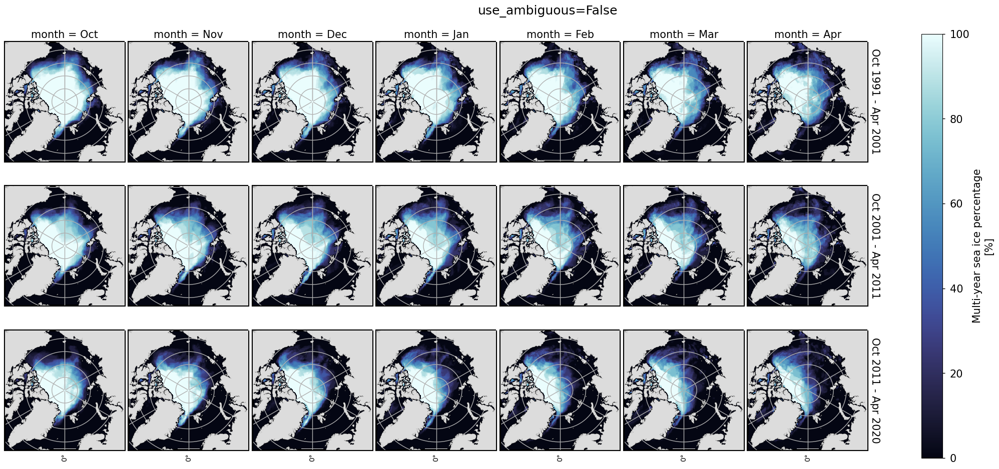

In [16]:
ambiguous = False
facet = plot_maps(ds_cds["percentage"].sel(use_ambiguous=ambiguous))
facet.fig.suptitle(f"use_{ambiguous=}", fontsize=18, y=1.025)
plt.show()

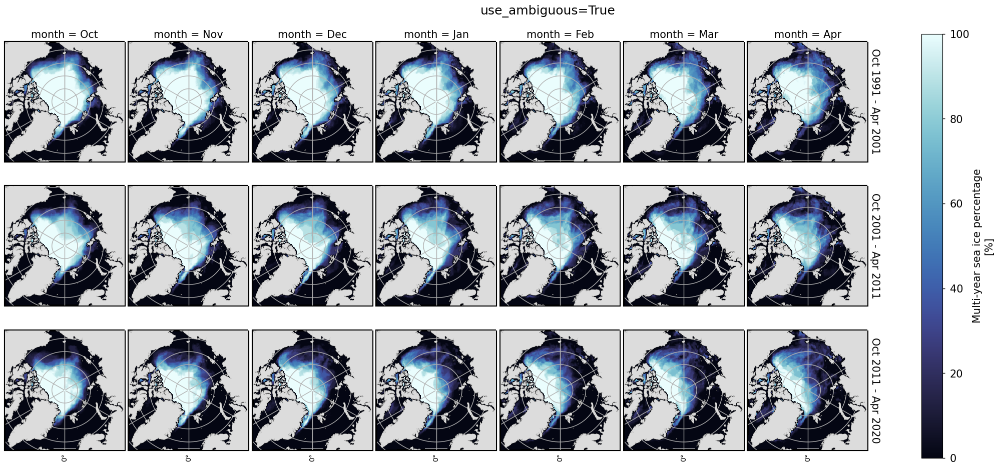

In [17]:
ambiguous = True
facet = plot_maps(ds_cds["percentage"].sel(use_ambiguous=ambiguous))
facet.fig.suptitle(f"use_{ambiguous=}", fontsize=18, y=1.025)
plt.show()

In [18]:
with xr.set_options(keep_attrs=True):
    da_bias = (ds_cds - ds_nersc)["percentage"]
da_bias.attrs["long_name"] = "Bias of " + da_bias.attrs["long_name"]


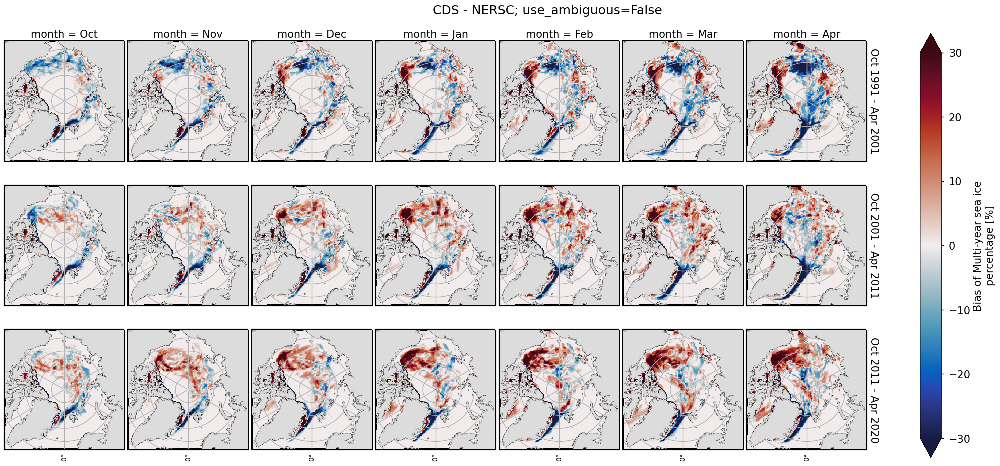

In [19]:
ambiguous = False
facet = plot_maps(
    da_bias.sel(use_ambiguous=ambiguous), cmap=cmocean.cm.balance, center=0, robust=True, vmin=-30, vmax=30,
)
facet.fig.suptitle(f"CDS - NERSC; use_{ambiguous=}", fontsize=18, y=1.025)
plt.show()

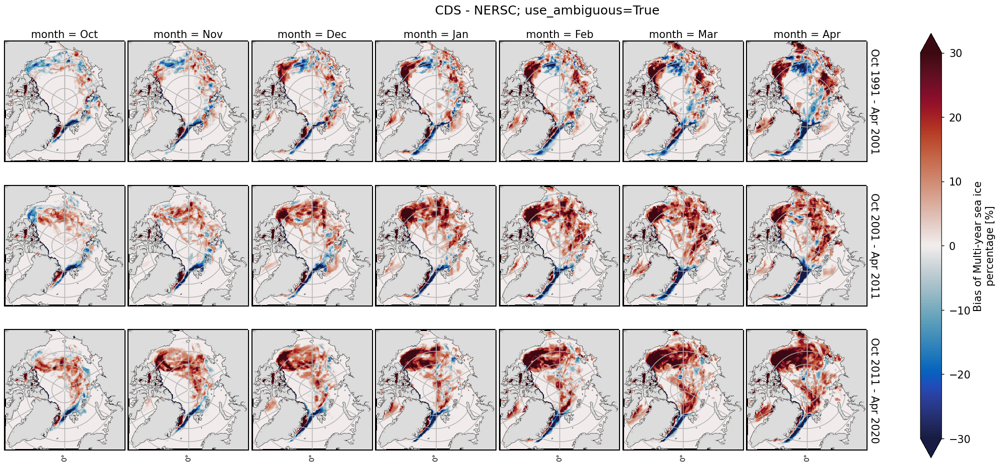

In [20]:
ambiguous = True
facet = plot_maps(
    da_bias.sel(use_ambiguous=ambiguous), cmap=cmocean.cm.balance, center=0, robust=True, vmin=-30, vmax=30,
)
facet.fig.suptitle(f"CDS - NERSC; use_{ambiguous=}", fontsize=18, y=1.025)
plt.show()

We note that the inclusion of ‘ambiguous’ data points primarily affects the magnitude of the difference, rather than the patterns. More precisely, when ‘ambiguous’ values are included into the analysis, the grid points of the CDS dataset are more likely associated with multi-year sea ice and, therefore, the difference between the CDS and the NERSC datasets becomes more positive. 

Compared to the NERSC dataset, the CDS product underestimates the amount of multi-year sea ice in the Greenland Sea, away from the coast of Greenland. Such a discrepancy might result from the difficulty of the NERSC dataset to well capture the impact of local dynamics on multi-year sea ice. Indeed, the drifts that were used to create the NERSC dataset have a daily temporal resolution. Thus, they might not fully represent the effects of the ocean since it is highly dynamic in the region. However, the discrepancy might also highlight issues with the CDS dataset as [[3]](https://tc.copernicus.org/articles/12/2073/2018/) showed the ability of the NERSC dataset to capture multi-year sea ice in the Greenland Sea through a comparison with Sentinel-1 SAR images, used as an independent dataset, on the 1st January 2016. Therefore, further analysis is necessary to determine what causes such a discrepancy and, therefore, which dataset most reliably provides information on multi-year sea ice in the region. 

The difficulty of the CDS dataset to discern between first-year sea ice and multi-year sea ice also appears when looking at the Labrador Sea. Indeed, while the Labrador Sea is known to only contain first-year sea ice, the CDS dataset indicates the presence of multi-year sea ice in the region. 

More difficult is to determine the quality of the two datasets in other sectors of the Arctic. For example, compared to the NERSC dataset, the CDS dataset shows higher percentages of multi-year sea ice over large portions of the Beaufort Sea, of the Chukchi Sea, and of the Eurasian Basin. We might speculate that, in the Eurasian Sea, the discrepancy might occur because this portion of the Arctic is partly covered by seasonal ice. Seasonal ice is not as thick as multi-year sea ice and, therefore, is more prone to breaking and deforming. As a result, the surface of first-year sea ice might resemble that of multi-year sea ice and be misinterpreted by the CDS algorithm. Instead, the disagreement in the Beaufort and Chukchi Seas might result from the NERSC dataset not being able to capture the westward advection of multi-year sea ice by the Beaufort Gyre, being it a hyghly dynamic feature. Additional analysis is needed to assess the causes behind these disagreements. 

## ℹ️ If you want to know more

### Key resources

CDS dataset used:

* [Sea ice edge and type daily gridded data from 1978 to present derived from satellite observations](https://cds.climate.copernicus.eu/datasets/satellite-sea-ice-edge-type?tab=overview) 

Additional resources:

* Section "SEA-ICE" in the [State of the Global Climate 2023](https://library.wmo.int/records/item/68835-state-of-the-global-climate-2023)
* [Learning material on sea ice provided by the National Snow and Ice Data Center](https://nsidc.org/learn/parts-cryosphere/sea-ice)
* [Arctic multi-year sea ice visualization](https://svs.gsfc.nasa.gov/4251) provided by NASA
* [Sea ice as a climate indicator](https://www.epa.gov/climate-indicators/climate-change-indicators-arctic-sea-ice)
* [How sea ice is observed](https://www.metoffice.gov.uk/research/climate/cryosphere-oceans/sea-ice/measure)
* [NARVAL, a visualization portal for Earth observation and model data in the high-latitude oceans](https://narval.nersc.no), offers visualizations of various sea-ice variables  

Code libraries used:

* [pandas](https://pandas.pydata.org/) 
* [xarray](https://docs.xarray.dev/en/stable/) 
* [matplotlib](https://matplotlib.org/) 
* [cmocean](https://matplotlib.org/cmocean/) 
* [cartopy](https://scitools.org.uk/cartopy/docs/latest/) 
* [C3S EQC custom functions](https://github.com/bopen/c3s-eqc-automatic-quality-control/tree/main/c3s_eqc_automatic_quality_control), `c3s_eqc_automatic_quality_control`,  prepared by [BOpen](https://www.bopen.eu/)


### References

- [[1]](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2011GL047735) Maslanik, J., Stroeve, J., Fowler, C., and Emery, W.: Distribution and trends in Arctic sea ice age through spring 2011, Geophys. Res. Lett., 38, L13502, https://doi.org/10.1029/2011GL047735, 2011.
- [[2]](https://www.cambridge.org/core/books/ocean-and-cryosphere-in-a-changing-climate/polar-regions/8D76B8865B796C16991F7A9FB6271C2D) Meredith, M., Sommerkorn, M., Cassotta, S., Derksen, C., Ekaykin, A., Hollowed, A., Kofinas, G., Mackintosh, A., Melbourne-Thomas, J., Muelbert, M. M. C., Ottersen, G., Pritchard, H., and Schuur, E.: Polar Regions, in: IPCC Special Report on the Ocean and Cryosphere in a Changing Climate, edited by: Pörtner, H.-O., Roberts, D. C., Masson-Delmotte, V., Zhai, P., Tignor, M., Poloczanska, E., Mintenbeck, K., Alegría, A., Nicolai, M., Okem, A., Petzold, J., Rama, B., and Weyer, N. M., chap. 3, 203–320, Cambridge University Press, Cambridge, UK and New York, NY, USA, https://doi.org/10.1017/9781009157964.005, 2019.
- [[3]](https://tc.copernicus.org/articles/12/2073/2018/) Korosov, A. A., Rampal, P., Pedersen, L. T., Saldo, R., Ye, Y., Heygster, G., Lavergne, T., Aaboe, S., and Girard-Ardhuin, F.: A new tracking algorithm for sea ice age distribution estimation, The Cryosphere, 12, 2073–2085, https://doi.org/10.5194/tc-12-2073-2018, 2018.
- [[4]](https://tc.copernicus.org/articles/17/1873/2023/tc-17-1873-2023.pdf) Regan, H., Rampal, P., Ólason, E., Boutin, G., Korosov, A.: Modelling the evolution of Arctic multiyear sea ice over 2000-2018, The Cryosphere, 17, 1873-1893, https://doi.org/10.5194/tc-17-1873-2023, 2023.
